In [1]:
import xarray as xr
import numpy as np
import os
from os.path import join
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from scipy.spatial import Voronoi, voronoi_plot_2d, cKDTree

In [2]:
# Make sure we're in the right directory
if os.path.basename(os.getcwd()) in ["notebooks", "examples"]:
    os.chdir("..")

In [4]:
DATA_DIR = "../Data/aibedo/"
order6_data_fn = 'compress.isosph.CESM2.historical.r1i1p1f1.Input.Exp8_fixed.nc'
ds = xr.open_dataset(join(DATA_DIR, order6_data_fn))
lon_l6 = ds.lon.data
lat_l6 = ds.lat.data
plabels = {p: np.load(f'notebooks/partition_labels/l{p}_labels.npy') for p in range(6)}


In [35]:
def visualize_partitions(labels, title, cmap='flag'):
    fig, axs = plt.subplots(1, 4)
    axs[0].scatter(x=lon_l6[:], y=lat_l6[:], s=2, c=labels, cmap=plt.get_cmap(cmap))

    cluster_indices, counts = np.unique(labels, return_counts=True)
    unique_counts = np.unique(counts)
    uc_to_c_clusters = {uc: labels.copy() for uc in unique_counts}
    for j, uc in enumerate(unique_counts[:3], 1):
        for c_i, mems_i in zip(cluster_indices, counts):
            if mems_i != uc:
                uc_to_c_clusters[uc][uc_to_c_clusters[uc] == c_i] = len(unique_counts)

        axs[j].scatter(x=lon_l6[:], y=lat_l6[:], s=2, c=uc_to_c_clusters[uc], cmap=plt.get_cmap(cmap))
        axs[j].set_title(f"Mems={uc}")


    axs[0].set_title(title)
    plt.show()

In [93]:
np.unique(plabels[list(plabels.keys())[0]], return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64),
 array([3431, 3431, 3405, 3405, 3418, 3434, 3402, 3381, 3427, 3406, 3411,
        3411], dtype=int64))

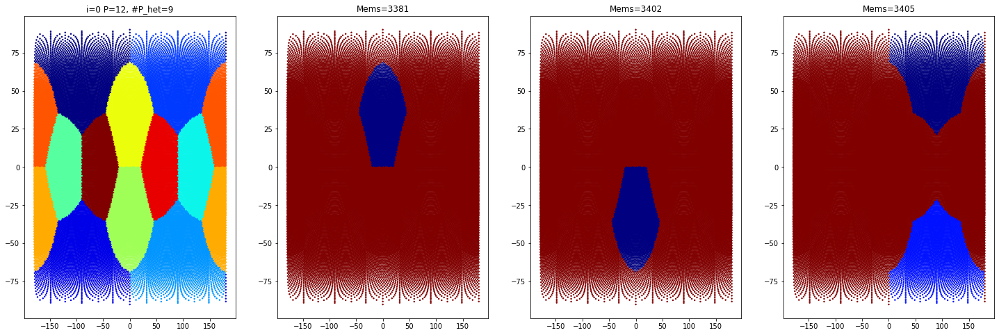

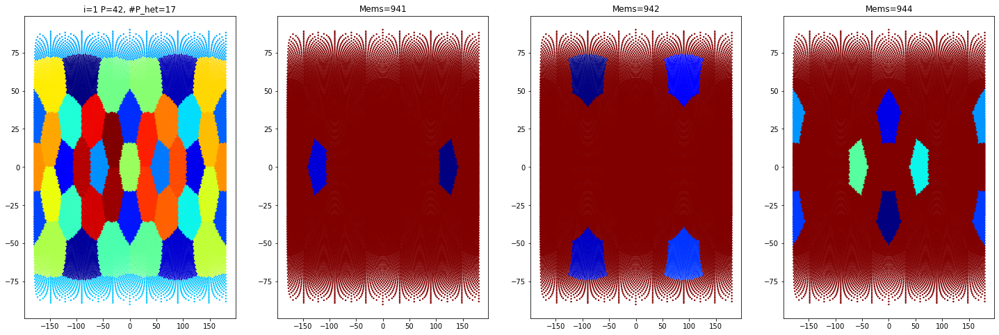

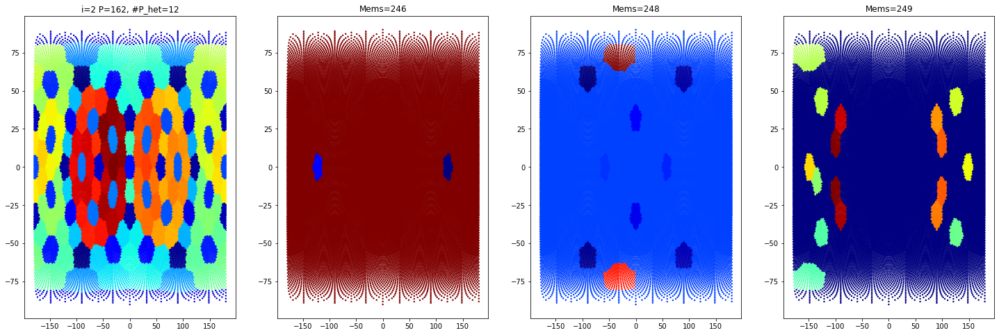

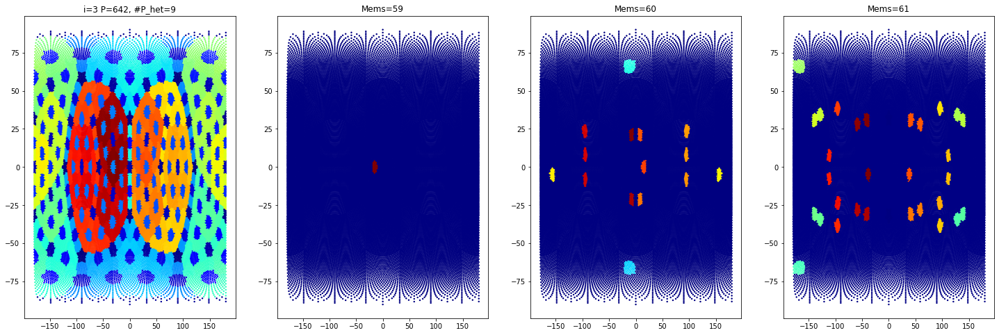

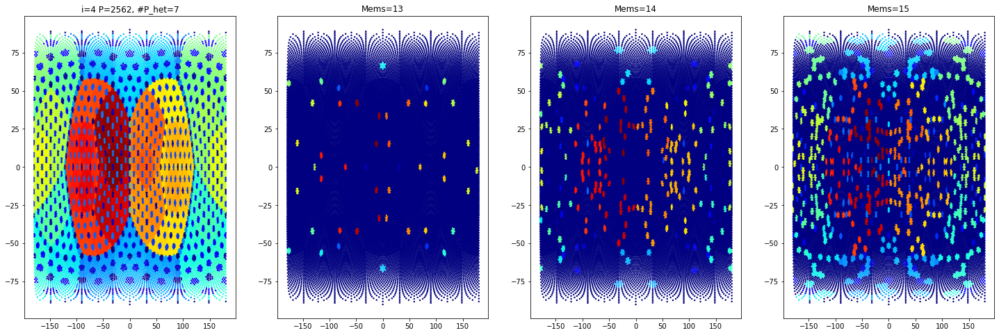

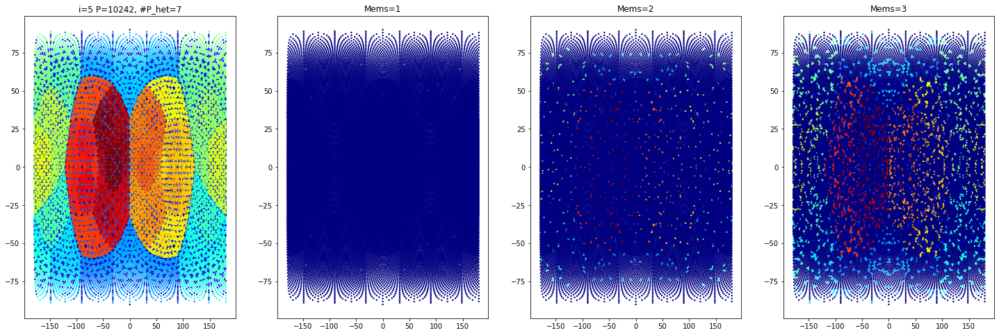

In [36]:
plt.rcParams['figure.figsize'] = [25, 8]  # general matplotlib parameters
for p, plabel in plabels.items():
    unique, counts = np.unique(plabel, return_counts=True)
    #print(unique, counts)
    unique_counts = np.unique(counts)
    n_clusters = len(unique)
    n_diff_clusters = len(unique_counts)
    visualize_partitions(plabel, f'i={p} P={n_clusters}, #P_het={n_diff_clusters}', cmap='jet')

In [91]:
def visualize_partitions2(labels, title, cmap='flag'):
    fig, axs = plt.subplots(1, 5)
    axs[0].scatter(x=lon_l6[:], y=lat_l6[:], s=2, c=labels, cmap=plt.get_cmap(cmap))

    cluster_indices, counts = np.unique(labels, return_counts=True)
    unique_n_mems, n_clusters_with_mems = np.unique(counts, return_counts=True)

    new_labels = np.zeros(len(labels), dtype=np.int64)
    cur_idx = 0
    clusters_count_start, clusters_count_end = dict(), dict()
    for i, (mems, n_clusters_with_mems) in enumerate(zip(unique_n_mems, n_clusters_with_mems)):
        clusters_count_start[mems] = cur_idx
        for c_i, mems_i in zip(cluster_indices, counts):
            if mems_i == mems:
                indices_of_cluster_i = (labels == c_i).nonzero()[0]
                new_labels[cur_idx:cur_idx+mems_i] = indices_of_cluster_i
                cur_idx += mems_i
        clusters_count_end[mems] = cur_idx
        assert mems * n_clusters_with_mems == clusters_count_end[mems] - clusters_count_start[mems], f"{mems * n_clusters_with_mems}, {clusters_count_end[mems]- clusters_count_start[mems]}"
    assert cur_idx == len(labels)
    print(new_labels)

    lon, lat, lab = lon_l6[:][new_labels], lat_l6[:][new_labels], labels[new_labels]
    axs[1].scatter(x=lon, y=lat, s=2, c=lab, cmap=plt.get_cmap(cmap))
    axs[0].set_title(title)

    for j, mems in enumerate(unique_n_mems[:3], 2):
        tmp_labs = np.ones(len(labels)) * len(unique_n_mems)
        tmp_labs[clusters_count_start[mems]:clusters_count_end[mems]] = lab[clusters_count_start[mems]:clusters_count_end[mems]]

        axs[j].scatter(x=lon, y=lat, s=2, c=tmp_labs, cmap=plt.get_cmap(cmap))
        axs[j].set_title(f"Mems={mems}")

    plt.show()

[    7    62    65 ... 37180 37182 37183]


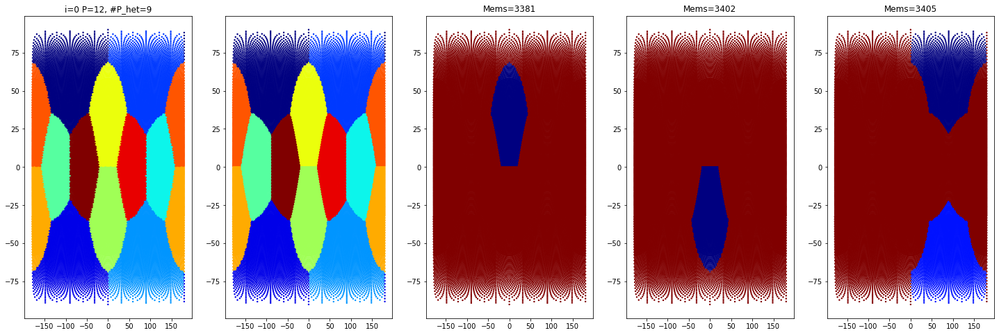

[    4   172   176 ... 40959 40960 40961]


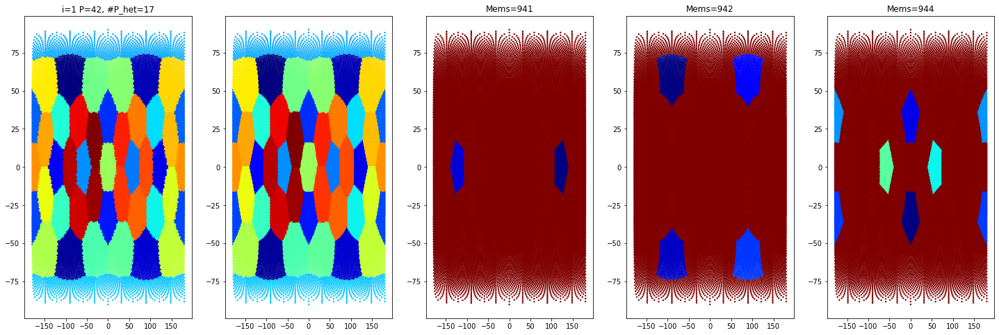

[    4   662   670 ... 24627 24652 24654]


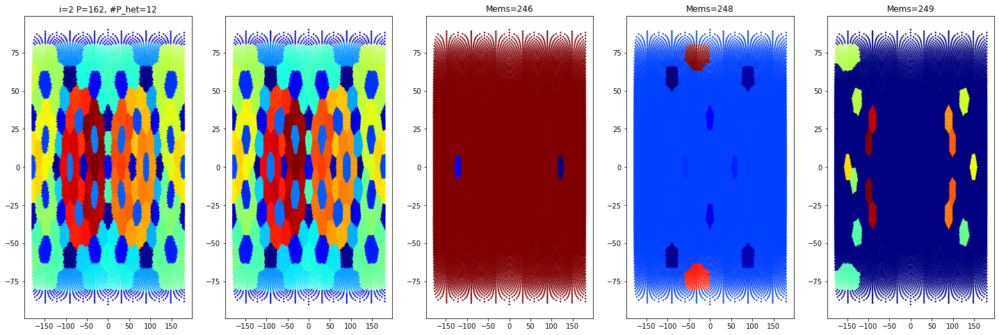

[  628  2494  2495 ... 30541 30547 30553]


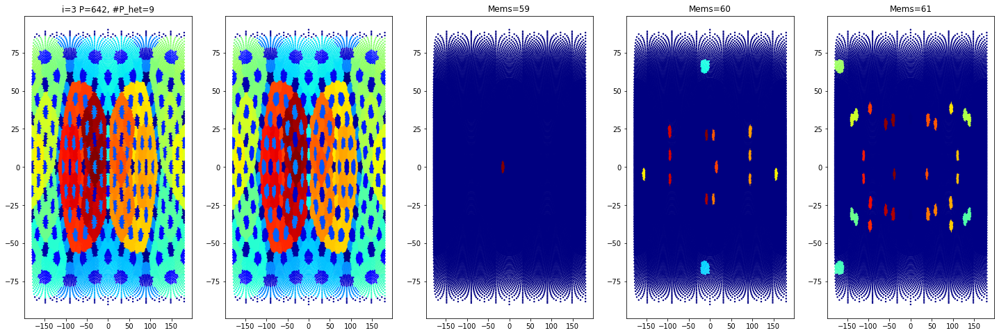

[    4  4034  5178 ... 37018 37020 37021]


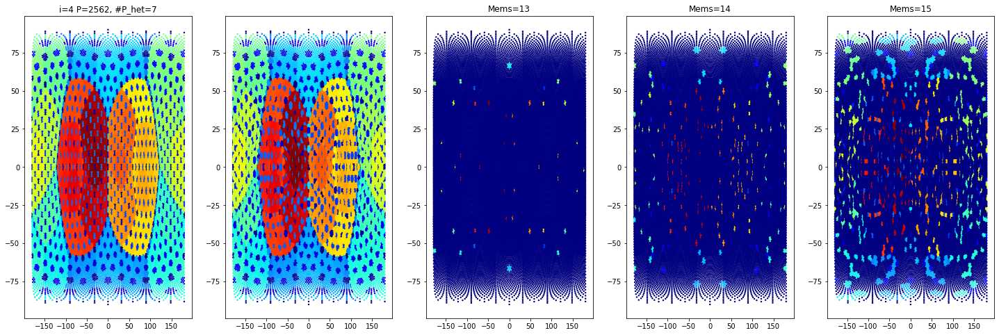

[   12    13   288 ... 40877 40878 40879]


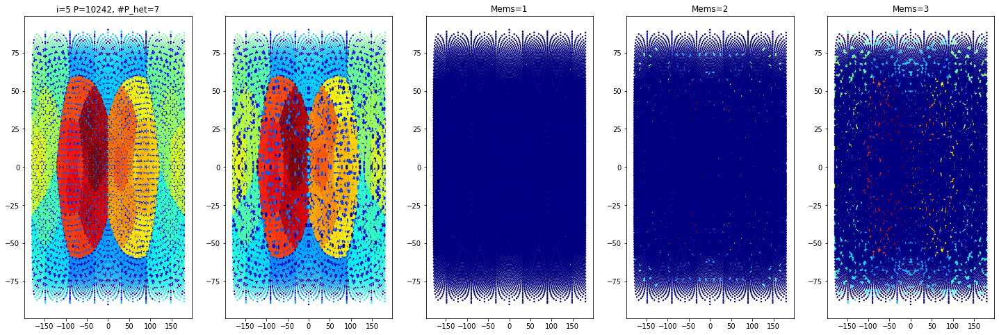

In [92]:
plt.rcParams['figure.figsize'] = [25, 8]  # general matplotlib parameters
for p, plabel in plabels.items():
    unique, counts = np.unique(plabel, return_counts=True)
    n_clusters = len(unique)
    n_diff_clusters = len(np.unique(counts))
    visualize_partitions2(plabel, f'i={p} P={n_clusters}, #P_het={n_diff_clusters}', cmap='jet')

In [114]:
from einops import rearrange
from torch import nn
import torch
class PatchEmbedSpherical(nn.Module):
    def __init__(self,
                 in_chans: int = 3,
                 embed_dim: int = 256,
                 patches_level: int = 4,
                 pre_embed_dim_factor: float = 2.0
                 ):
        super().__init__()
        assert 1 <= patches_level <= 6, "patches_level must be in [1, 5]"
        cluster_id_idx = np.load(f'notebooks/partition_labels/l{patches_level-1}_labels.npy')
        assert 0 in cluster_id_idx, "Index of first cluster must start from 0"
        cluster_ids_unique, clusters_n_members = np.unique(cluster_id_idx, return_counts=True)
        # cluster_ids_unique is same as [0, 1,.., n_clusters-1]
        # clusters_n_members is the number of pixels in each cluster
        unique_member_counts, self.n_clusters_with_member_count = np.unique(clusters_n_members, return_counts=True)
        # unique_member_counts contains all the unique number of pixels that the clusters have
        # n_clusters_with_member_count is the number of clusters with a given number of pixels
        #   E.g.: Let m, nc = unique_member_counts[0], n_clusters_with_member_count[0], then
        #           there are nc clusters with each of them containing m pixels

        cluster_ids_perm = np.zeros(len(cluster_id_idx), dtype=np.int64)
        # cluster_ids_perm will permute the spherical pixels so that the pixels in each cluster are contiguous
        cur_idx = 0
        self.sizes_of_unique_mem_count_clusters = []
        # self.sizes_of_unique_mem_count_clusters will store the total number of pixels
        #   in each set of clusters with unique pixel count
        for i, (mems_i, n_clusters_with_mems) in enumerate(zip(unique_member_counts, self.n_clusters_with_member_count)):
            clusters_with_mems_i_start = cur_idx
            for c_i, mems_c_i in zip(cluster_ids_unique, clusters_n_members):
                if mems_c_i == mems_i:
                    indices_of_cluster_i = (cluster_id_idx == c_i).nonzero()[0]
                    cluster_ids_perm[cur_idx:cur_idx + mems_c_i] = indices_of_cluster_i
                    cur_idx += mems_c_i
            assert mems_i * n_clusters_with_mems == cur_idx - clusters_with_mems_i_start, f"i={i}, {mems_i}, {n_clusters_with_mems}, {cur_idx}, {clusters_with_mems_i_start}"
            self.sizes_of_unique_mem_count_clusters += [mems_i * n_clusters_with_mems]
        assert cur_idx == len(cluster_id_idx)
        self.permute_idx = torch.from_numpy(cluster_ids_perm).long()

        # Now, we can get to the actual embedding layers/weights
        pre_embed_dim = int(embed_dim*pre_embed_dim_factor)
        pre_embedders = list()
        for n_pixels_in_cluster in unique_member_counts:
            pre_embedders += [nn.Linear(in_chans*n_pixels_in_cluster, pre_embed_dim)]

        self.pre_embedders = nn.ModuleList(pre_embedders)
        self.embedder = nn.Linear(pre_embed_dim, embed_dim)


    def forward(self, x):
        # Shape of input, x: [batch-size, #pixels, #input-channels] = (B, S, C)
        # First, permute x so that the pixels in each patch are contiguous in the spatial dim (dim=1)
        x = x[:, self.permute_idx, :]
        # Now, split x into the multiple sub-tensors based on the number of pixels in each patch
        x = list(torch.split(x, self.sizes_of_unique_mem_count_clusters, dim=1))
        # Continue projecting each patch to the pre-embedding dim:
        for i, (x_sub, n_patches_in_x_sub, sub_embedder) in enumerate(
                zip(x, self.n_clusters_with_member_count, self.pre_embedders)
        ):
            # First, we need to extract the patch dim from x_sub & flatten the pixels in each patch to the channel dim:
            x_sub = rearrange(x_sub, 'b (p m) c -> b p (m c)', p=n_patches_in_x_sub)
            # Now we can project the (pixels x in-channels) in each patch to the pre-embedding dim
            x[i] = sub_embedder(x_sub)   # new shape: (B, p, pre_embed_dim)
        # Finally, we can concatenate the pre-projected patches back together
        x = torch.cat(x, dim=1)  # new shape: (B, P, pre_embed_dim)
        # ... and project them to the embedding dim
        x = self.embedder(x)   # new shape: (B, P, embed_dim)
        return x

In [115]:
emb_sph = PatchEmbedSpherical(3, 6, 4, 2)
x = torch.randn([2, 40962, 3])
emb_sph(x).shape

torch.Size([2, 642, 6])